# Ковыршин ИУ5-64Б НИРС типовое задание

## Поиск и выбор набора данных для построения моделей машинного обучения. На основе выбранного набора данных студент должен построить модели машинного обучения для решения или задачи классификации, или задачи регрессии.

В качестве набора данных будем использовать набор данных по отклику клиентов на рекламные предложения:<br>
https://www.kaggle.com/datasets/whenamancodes/ideal-customer-analysis-personality-test

Возможность определить, насколько клиент охотно откликается на рекламное предложение, будет полезна любому бизнесу, помогая сэкономить время и ресурсы, затрачиваемые на рекламу.

Датасет состоит из одного файла: **marketing_campaign.csv**

Файл содержит следующие колонки:
- *ID*
- *Year_Birth* - год рождения клиента
- *Education* - уровень образования клиента
- *Marital_Status* - семейное положение клиента
- *Income* - доход клиента
- *Kidhome* - количество малолетних детей в доме клиента
- *Teenhome* - количество детей-подростков в доме клиента
- *Dt_Customer* - дата первого регистрации клиента в компании
- *Recency* - количество дней, прошедших с последней покупки клиента
- *Complain* - жаловался ли клиент в течение последних 2-х лет
- *MntWines* - сумма, потраченная клиентом на вино за последние 2 года
- *MntFruits* - сумма, потраченная клиентом на фрукты за последние 2 года
- *MntMeatProducts* - сумма, потраченная клиентом на мясо за последние 2 года
- *MntFishProducts* - сумма, потраченная клиентом на рыбу за последние 2 года
- *MntSweetProducts* - сумма, потраченная клиентом на сладости за последние 2 года
- *MntGoldProducts* - сумма, потраченная клиентом на золото за последние 2 года
- *NumDealsPurchases* - количество покупок клиента, сделанных со скидкой
- *AcceptedCmp1* - принял ли клиент предложение во время первой кампании
- *AcceptedCmp2* - принял ли клиент предложение во время второй кампании
- *AcceptedCmp3* - принял ли клиент предложение во время третьей кампании
- *AcceptedCmp4* - принял ли клиент предложение во время четвертой кампании
- *AcceptedCmp5* - принял ли клиент предложение во время пятой кампании
- *Response* - принял ли клиент предложение во время последней кампании
- *NumWebPurchases* - количество покупок клиента, сделанных через вебсайт
- *NumCatalogPurchases* - количество покупок клиента, сделанных через каталог
- *NumStorePurchases* - количество покупок клиента, сделанных напрямую в магазине
- *NumWebVisitsMonth* - количество посещений клиентом вебсайта за последний месяц

Будем решать задачу классификации: определять, откликнется ли клиент на предложение

### Импорт библиотек

In [41]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import ConfusionMatrixDisplay, balanced_accuracy_score, roc_curve, roc_auc_score, f1_score

### Загрузка данных

Загрузим данные из файла с помощью библиотеки pandas. Удалим дубликаты на случай, если они имеются.

In [42]:
data = pd.read_csv('marketing_campaign.csv', delimiter='\t')
data = data.drop_duplicates()

## Проведение разведочного анализа данных. Построение графиков, необходимых для понимания структуры данных. Анализ и заполнение пропусков в данных.

### Основные характеристики датасета

Первые 5 строк датасета.

In [43]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


Размер датасета.

In [44]:
data.shape

(2240, 29)

Список колонок датасета.

In [45]:
data.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

Список колонок с типами данных.

In [46]:
data.dtypes

ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
dtype: object

Обнаружили колонки, не входящие в описание набора данных. Проверим их содержание и определим их информативность.

In [47]:
data['Z_CostContact'].unique(), data['Z_Revenue'].unique()

(array([3]), array([11]))

Колонки содержат всего одно единственное значение, поэтому можно их удалить.

Колонки AcceptedCmp(1-5) и Response обозначают одно и то же: откликнулся ли клиент на предложение во время какой-либо из 6 кампаний. Объединим их и заменим.<br>
Колонку Dt_Customer с датой регистрации клиента в компании преобразуем из формата даты в числовой формат: номер дня с 01.01.1970.<br>
Удалим колонки ID, Z_CostContact, Z_Revenue, так как они, очевидно, не содержат полезной информации.

In [48]:
data_bought = []
for _, row in data.iterrows():
    data_bought += [row['AcceptedCmp1'] or row['AcceptedCmp2'] or row['AcceptedCmp3'] or row['AcceptedCmp4'] or row['AcceptedCmp5'] or row['Response']]

data_dt_customer = []
for _, row in data.iterrows():
    data_dt_customer += [int(datetime.strptime(row['Dt_Customer'], '%d-%m-%Y').timestamp() // 86400) + 1]

data = data.drop(columns=['ID', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Z_CostContact', 'Z_Revenue', 'Response'])
data['Bought'] = data_bought
data['Dt_Customer'] = data_dt_customer

Проверим наличие пустых значений.

In [49]:
data.isnull().sum()

Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
Complain                0
Bought                  0
dtype: int64

Удалим пустые строчки.

In [50]:
data = data.dropna()
data.isnull().sum()

Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
Complain               0
Bought                 0
dtype: int64

Проверим форму и содержание преобразованного набора данных.

In [51]:
data.shape

(2216, 21)

In [52]:
data.dtypes

Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer              int64
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
Complain                 int64
Bought                   int64
dtype: object

In [53]:
COLUMNS = data.columns
COLUMNS

Index(['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Complain', 'Bought'],
      dtype='object')

In [54]:
data.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Bought
0,1957,Graduation,Single,58138.0,0,0,15587,58,635,88,...,172,88,88,3,8,10,4,7,0,1
1,1954,Graduation,Single,46344.0,1,1,16137,38,11,1,...,2,1,6,2,1,1,2,5,0,0
2,1965,Graduation,Together,71613.0,0,0,15938,26,426,49,...,111,21,42,1,8,2,10,4,0,0
3,1984,Graduation,Together,26646.0,1,0,16111,26,11,4,...,10,3,5,2,2,0,4,6,0,0
4,1981,PhD,Married,58293.0,1,0,16089,94,173,43,...,46,27,15,5,5,3,6,5,0,0


Заранее запомним числовые и категориальные признаки, а также название колонки с целевым признаком.

In [55]:
NUM_COLUMNS = ['Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth']
CAT_COLUMNS = ['Education', 'Marital_Status', 'Complain']
TARGET_KEY = 'Bought'

**Вывод. Набор данных не содержит пропусков.**

### Построение графиков для понимания структуры данных

Построим парные диаграммы, отображая цветом значение целевого признака.

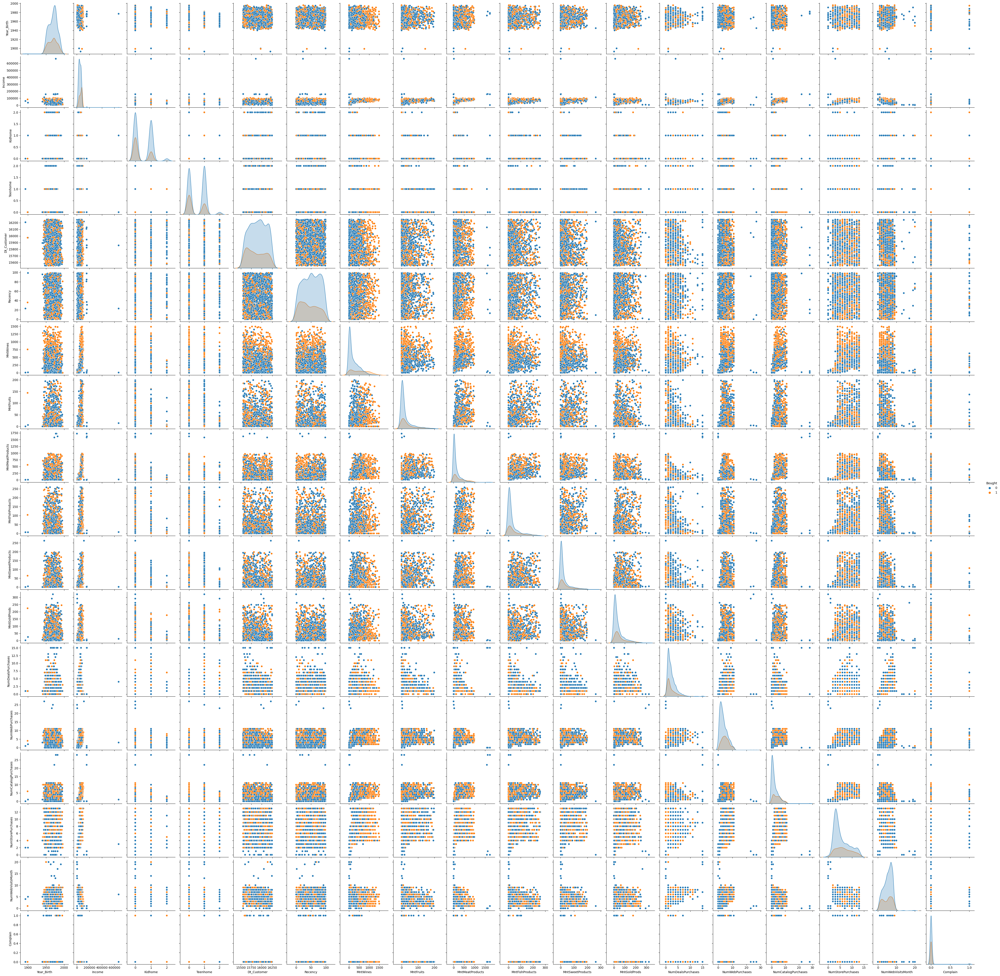

In [56]:
sns.pairplot(data, hue=TARGET_KEY)

Целевой признак содержит только значения 0 и 1.

In [57]:
data[TARGET_KEY].unique()

array([1, 0])

Дисбаланс классов целевого признака.

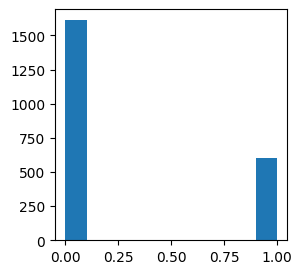

In [58]:
fig, ax = plt.subplots(figsize=(3, 3))
plt.hist(data[TARGET_KEY])
plt.show()

In [59]:
total = data.shape[0]
class_0, class_1 = data[TARGET_KEY].value_counts()
print(f'Класс 0: {round(class_0 / total * 100, 2)}%\nКласс 1: {round(class_1 / total * 100, 2)}%')

Класс 0: 72.7%
Класс 1: 27.3%


**Вывод. Дисбаланс классов присутствует, но является приемлемым.**

Скрипичные диаграммы для всех числовых признаков.

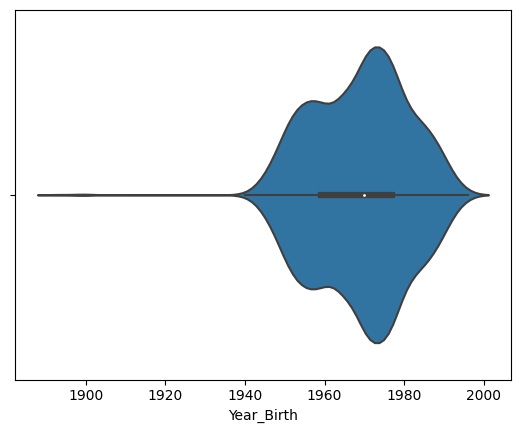

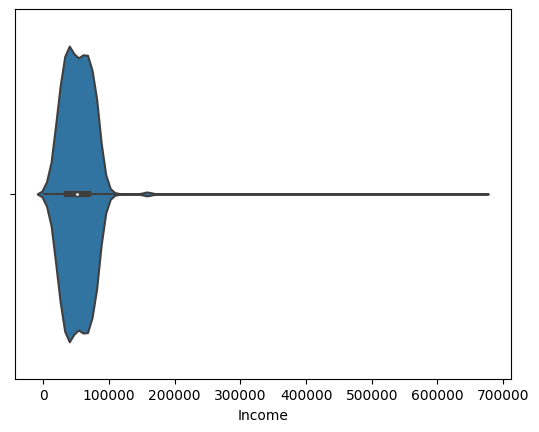

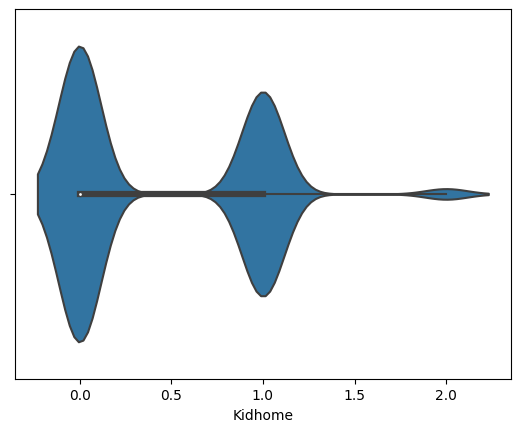

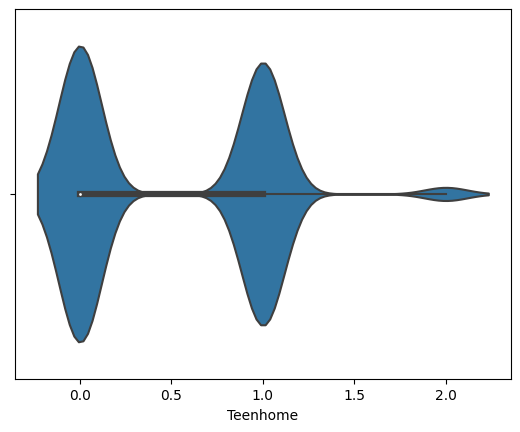

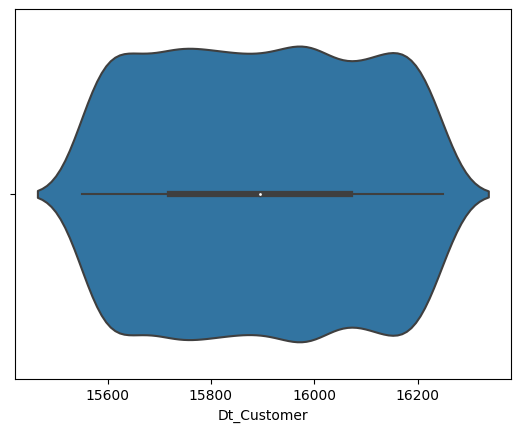

...

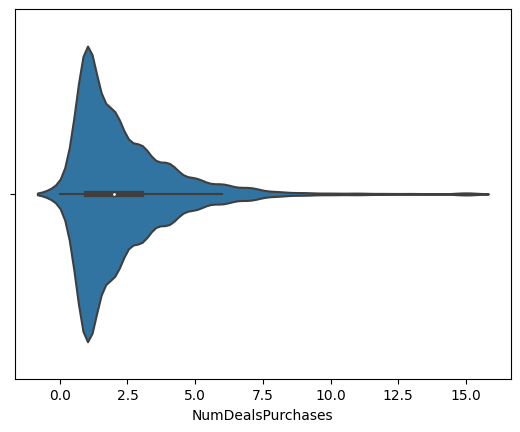

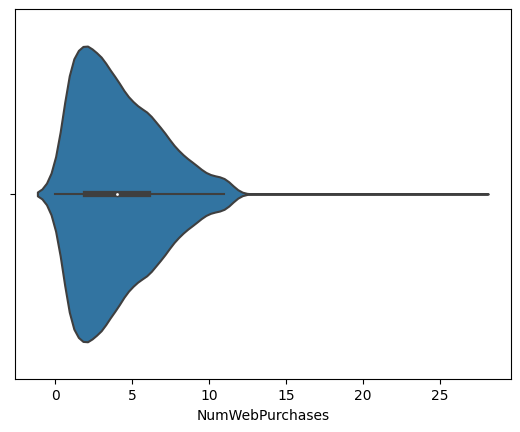

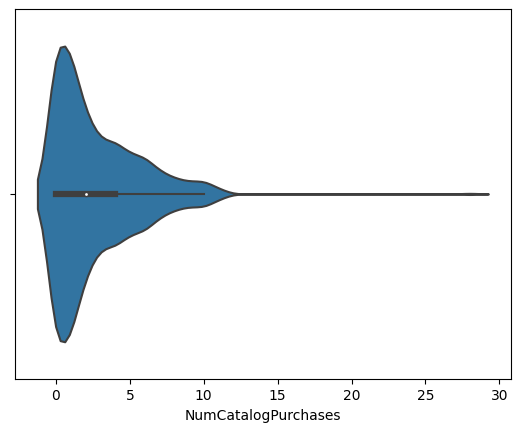

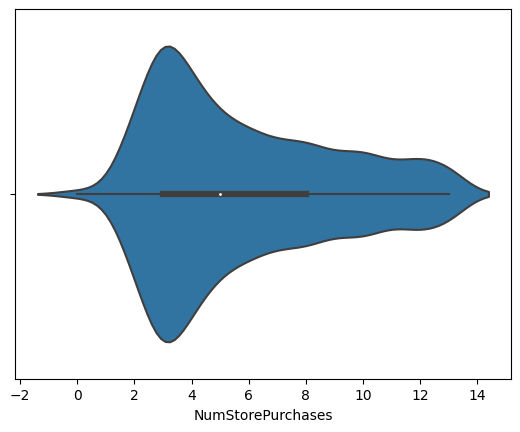

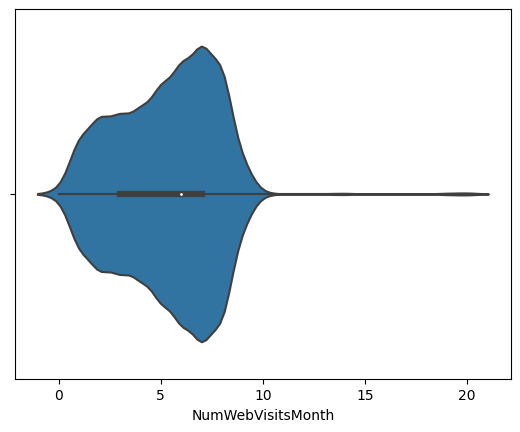

In [60]:
for col in NUM_COLUMNS:
    sns.violinplot(x=data[col])
    plt.show()


### Выбор признаков, подходящих для построения моделей. Кодирование категориальных признаков. Масштабирование данных. Формирование вспомогательных признаков, улучшающих качество моделей.

Масштабируем все числовые и закодируем все категориальные признаки.

In [61]:
mms = MinMaxScaler()
le = LabelEncoder()
data_scaled = data.copy()

for col in NUM_COLUMNS:
    data_scaled[col] = mms.fit_transform(data[[col]])

for col in CAT_COLUMNS:
    data_scaled[col] = le.fit_transform(data[col])

data_scaled.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Bought
0,0.621359,2,4,0.084832,0.0,0.0,0.051502,0.585859,0.425318,0.442211,...,0.664093,0.335878,0.274143,0.200000,0.296296,0.357143,0.307692,0.35,0,1
1,0.592233,2,4,0.067095,0.5,0.5,0.838340,0.383838,0.007368,0.005025,...,0.007722,0.003817,0.018692,0.133333,0.037037,0.035714,0.153846,0.25,0,0
2,0.699029,2,5,0.105097,0.0,0.0,0.553648,0.262626,0.285332,0.246231,...,0.428571,0.080153,0.130841,0.066667,0.296296,0.071429,0.769231,0.20,0,0
3,0.883495,2,5,0.037471,0.5,0.0,0.801144,0.262626,0.007368,0.020101,...,0.038610,0.011450,0.015576,0.133333,0.074074,0.000000,0.307692,0.30,0,0
4,0.854369,4,3,0.085065,0.5,0.0,0.769671,0.949495,0.115874,0.216080,...,0.177606,0.103053,0.046729,0.333333,0.185185,0.107143,0.461538,0.25,0,0


Проверим, что масштабирование не повлияло на распределение данных.

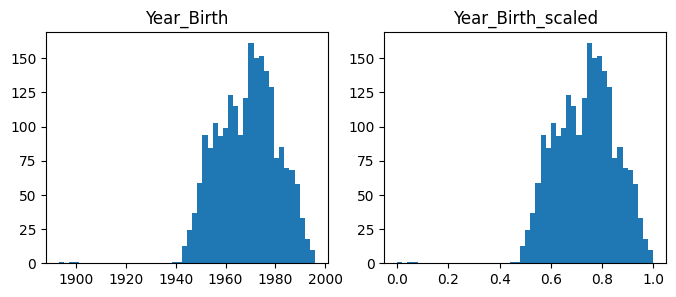

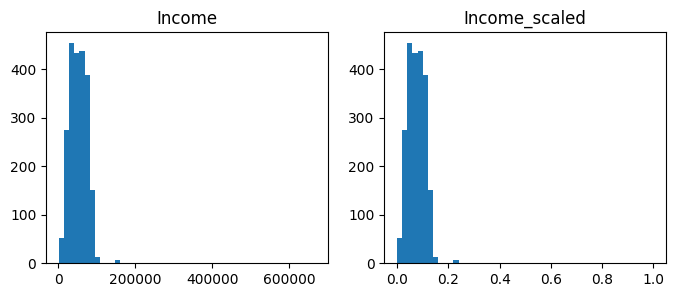

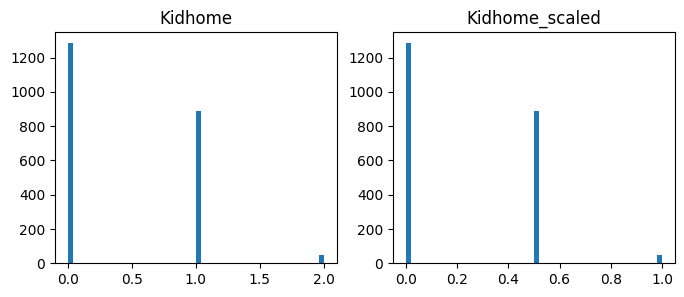

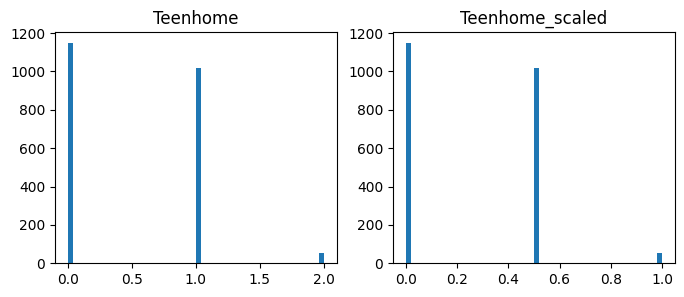

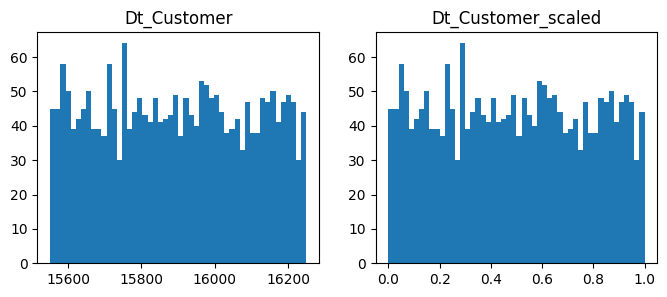

...

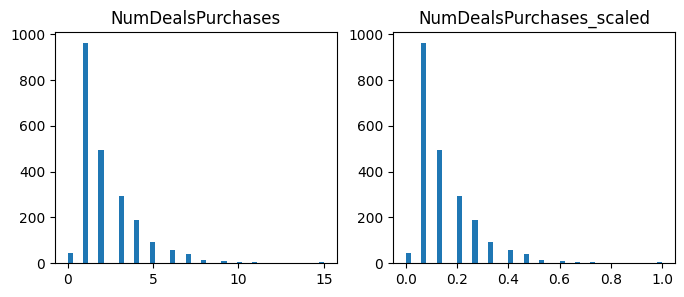

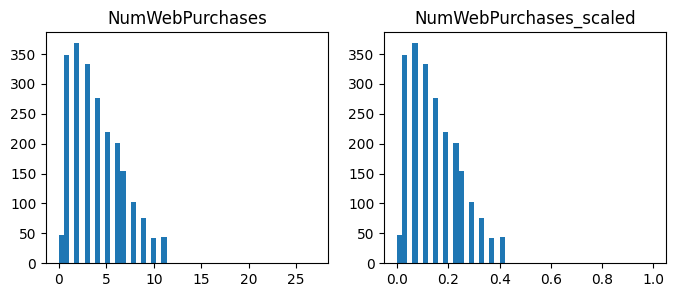

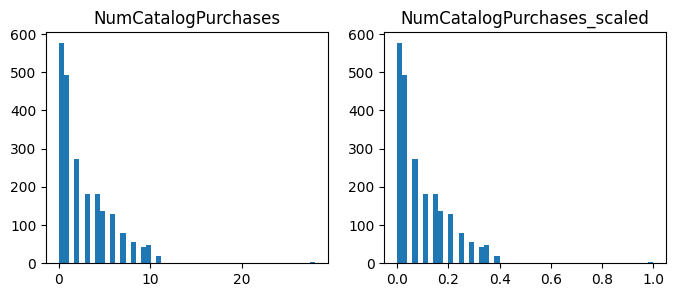

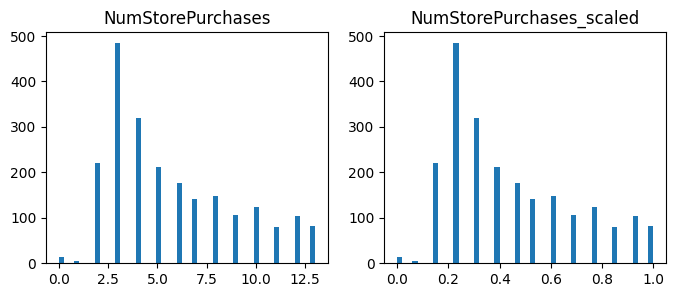

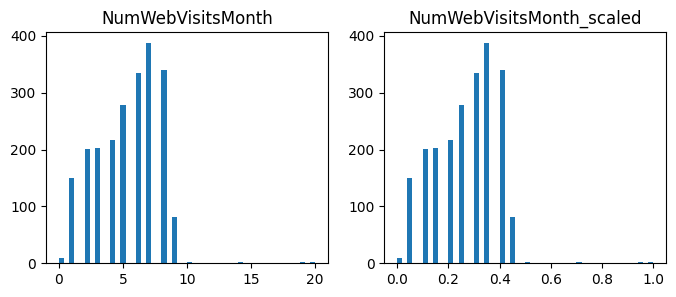

In [62]:
for col in NUM_COLUMNS:
    col_scaled = col + '_scaled'

    fig, ax = plt.subplots(1, 2, figsize=(8,3))
    ax[0].hist(data[col], 50)
    ax[1].hist(data_scaled[col], 50)
    ax[0].title.set_text(col)
    ax[1].title.set_text(col_scaled)
    plt.show()

**Вывод. Масштабирование данных не повлияло на их распределение.**

In [63]:
data = data_scaled

### Проведение корреляционного анализа данных. Формирование промежуточных выводов о возможности построения моделей машинного обучения.

Построим матрицу корреляции для набора данных.

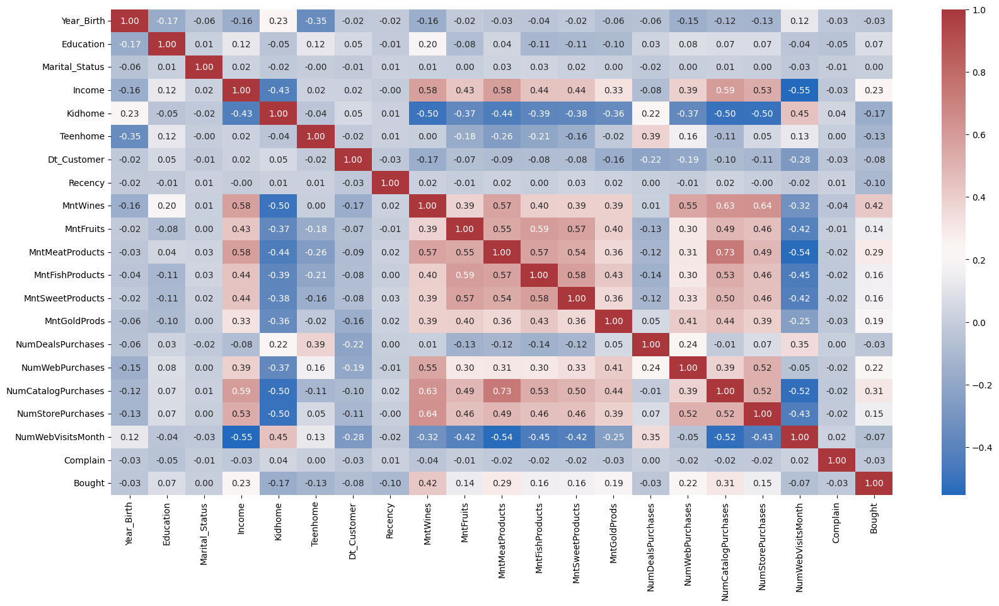

In [64]:
my_cmap=sns.color_palette('vlag', as_cmap=True)
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(data.corr(), annot=True, fmt='.2f', cmap=my_cmap)
plt.show()

На основе корреляционной матрицы можно сделать следующие выводы:
- Целевой признак наиболее сильно коррелирует с MntWines (0.42), NumCatalogPurchases (0.31), MntMeatProducts (0.29). Эти признаки следует оставить в модели.
- Нецелевых признаков, имеющих между собой особо сильную корреляцию, в наборе данных не наблюдается.
- В наборе данных присутствуют признаки, имеющие нулевую корреляцию с целевым. Их можно удалить.
- Все значения коэффициентов корреляции между признаками довольно низкие по модулю, и такие данные, вероятно, нельзя будет использовать для построения модели машинного обучения надлежащего качества.  

Удалим признаки, имеющие с целевым низкую по модулю корреляцию (< 0.15).

In [65]:
data = data.drop(columns=['Year_Birth', 'Education', 'Marital_Status', 'Teenhome', 'Dt_Customer', 'Recency', 'MntFruits', 'NumDealsPurchases', 'NumWebVisitsMonth', 'Complain'])
data.head()

,Income,Kidhome,MntWines,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,Bought
0,0.084832,0.0,0.425318,0.316522,0.664093,0.335878,0.274143,0.296296,0.357143,0.307692,1
1,0.067095,0.5,0.007368,0.003478,0.007722,0.003817,0.018692,0.037037,0.035714,0.153846,0
2,0.105097,0.0,0.285332,0.073623,0.428571,0.080153,0.130841,0.296296,0.071429,0.769231,0
3,0.037471,0.5,0.007368,0.011594,0.038610,0.011450,0.015576,0.074074,0.000000,0.307692,0
4,0.085065,0.5,0.115874,0.068406,0.177606,0.103053,0.046729,0.185185,0.107143,0.461538,0


### Выбор метрик для последующей оценки качества моделей.

Будем использовать метрики:
- Метрика balanced accuracy: имеет смысл использовать в качестве метрики именно сбалансированную точность, так как набор данных имеет высокий дисбаланс классов целевого признака. Использоваться будет функция [balanced_accuracy_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.balanced_accuracy_score.html)
- Метрика $F_1$-мера: метрика как среднее гармоническое precision и recall позволяет учитывать обе эти метрики одновременно. Использоваться будет функция [f1_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html#sklearn.metrics.f1_score)
- Метрика ROC AUC: площадь под графиком ROC-кривой позволяет оценить качество модели, учитывая True Positive Rate и False Positive Rate. Использоваться будет функция [roc_auc_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html#sklearn.metrics.roc_auc_score)

### Выбор наиболее подходящих моделей для решения задачи классификации.

Будут использованы модели:
- Метод k ближайших соседей
- Логистическая регрессия
- Метод опорных векторов
- Случайный лес
- Градиентный бустинг

### Формирование обучающей и тестовой выборок на основе исходного набора данных.

Выделим из исходного набора данных обучающую и тестовую выборки.

In [66]:
X_data, y_data = data.drop(columns=[TARGET_KEY]), data[[TARGET_KEY]]
X_test, X_train, y_test, y_train = train_test_split(X_data, y_data, shuffle=True, stratify=y_data)

### Построение базового решения (baseline) для выбранных моделей без подбора гиперпараметров.

Для создания моделей с параметрами, их обучения, сохранения предсказаний, вычисления и визулизации метрик был насписан класс ModelList.

In [67]:
class ModelList:
    def __init__(self, **models):
        self.__model_keys = list(models.keys())
        self.__model_classes = models
        self.__model_params = {key: {} for key in self.__model_keys}
        self.__metric_labels = []
        self.__metric_fns = {}
        self.__model_metrics = {key: {} for key in self.__model_keys}
        self.__models = {}
        self.__model_pred = {}
        self.X_test = None
        self.y_test = None
        self.X_train = None
        self.y_train = None

    def set_params(self, model_key: str, **params):
        try:
            self.__models[model_key]
            return
        except:
            self.__model_params[model_key] = params

    def set_metrics(self, **metrics):
        for key in metrics:
            self.__metric_fns[key] = metrics[key]
            self.__metric_labels += [key]

    def predict(self, model_key: str | None = None):
        if model_key:
            self.__model_pred[model_key] = self.__models[model_key].predict(self.X_test)
            return
        for key in self.__model_keys:
            self.__model_pred[key] = self.__models[key].predict(self.X_test)

    def fit(self, model_key: str | None = None):
        if model_key:
            self.__models[model_key].fit(self.X_train, self.y_train.to_numpy().flatten())
        for key in self.__model_keys:
            self.__models[key].fit(self.X_train, self.y_train.to_numpy().flatten())


    def initialize(self, model_key: str | None = None):
        if model_key:
            self.__models[model_key] = self.__model_classes[model_key](**self.__model_params[model_key])
            return
        for key in self.__model_keys:
            self.__models[key] = self.__model_classes[key](**self.__model_params[key])

    @property
    def keys(self):
        return self.__model_keys
    
    @property
    def predictions(self):
        return self.__model_pred

    @property
    def classes(self):
        return self.__model_classes
    
    @property
    def metrics(self):
        return self.__metric_labels

    def __getitem__(self, model_key: str):
        return self.__models[model_key]

    def __setitem__(self, model_key: str, value):
        self.__model_keys += [model_key]
        self.__model_classes[model_key] = value
        self.__model_params[model_key] = {}
        self.__model_metrics[model_key] = {}

    def __iter__(self):
        return iter(self.__models.items())
    
    def __draw_roc_curve(self, y_true, y_score, ax):
        fpr, tpr, _ = roc_curve(y_true, y_score)
        roc_auc_value = roc_auc_score(y_true, y_score)
        lw = 2
        ax.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve (area = %0.2f)' % roc_auc_value)
        ax.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
        ax.set_xlim([0.0, 1.0])
        ax.set_xlim([0.0, 1.0])
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title('Receiver operating characteristic')
        ax.legend(loc="lower right")

    def get_model_metrics(self, model_key):
        y_pred_proba = self.__models[model_key].predict_proba(self.X_test)
        y_pred_proba = y_pred_proba[:,1]
    
        for metric_label in self.__metric_labels:
            self.__model_metrics[model_key][metric_label] = self.__metric_fns[metric_label](self.y_test, self.__model_pred[model_key])

        fig, ax = plt.subplots(ncols=2, figsize=(20,10))
        self.__draw_roc_curve(self.y_test, y_pred_proba, ax[0])
        ConfusionMatrixDisplay.from_predictions(y_test, self.__model_pred[model_key], ax=ax[1], cmap=sns.color_palette("YlOrBr", as_cmap=True), normalize='true')
        fig.suptitle(model_key)
        plt.show()

    def plot_metrics(self, metric_label):
        metric_values = sorted([(model_key, self.__model_metrics[model_key][metric_label]) for model_key in self.__model_keys], key=lambda x: x[1])
        metric_models = [model_name for model_name, _ in metric_values]
        metric_scores = [model_score for _, model_score in metric_values]
        _, ax = plt.subplots(figsize=(20, 10))
        ax.set_xlim([0, 1])
        pos = np.arange(len(self.__model_keys))
        ax.barh(pos, metric_scores,
                    align='center',
                    height=0.5, 
                    tick_label=metric_models)
        ax.set_title(metric_label)
        for x, y in zip(pos, metric_scores):
            plt.text(0.01, x-0.05, str(round(y,3)), color='white').set_bbox({
                  'facecolor': 'black'
            })
        plt.show()

Создание и обучение моделей без параметров, получение предсказаний.

In [68]:
model_list = ModelList(KNN=KNeighborsClassifier, LR=LogisticRegression, SVC=SVC, RF=RandomForestClassifier, GB=GradientBoostingClassifier)
model_list.X_train = X_train
model_list.y_train = y_train
model_list.X_test = X_test
model_list.y_test = y_test
model_list.set_params('SVC', probability=True)
model_list.initialize()
model_list.fit()
model_list.predict()

Вычисление метрик для каждой модели, отрисовка ROC-кривых и матриц ошибок. 

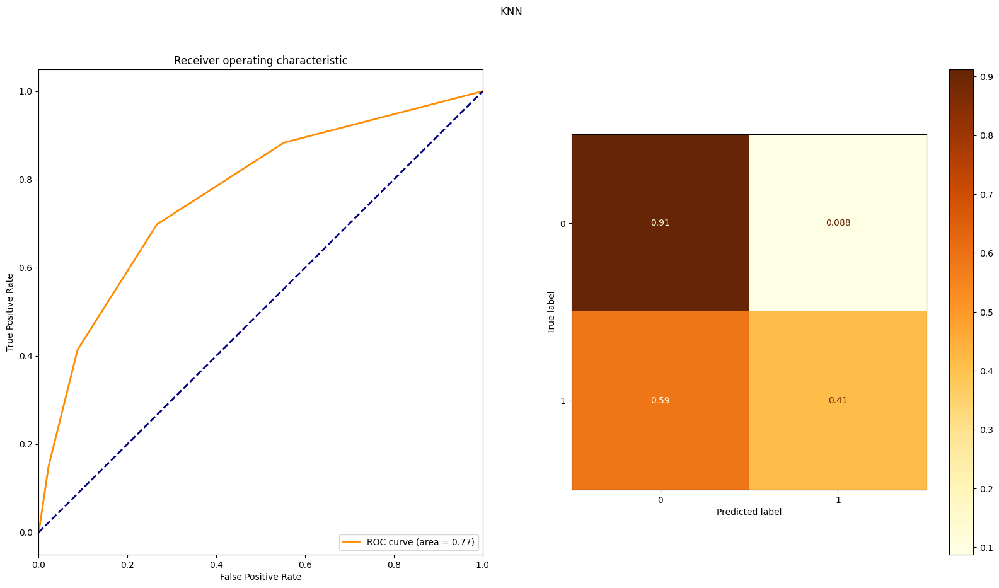

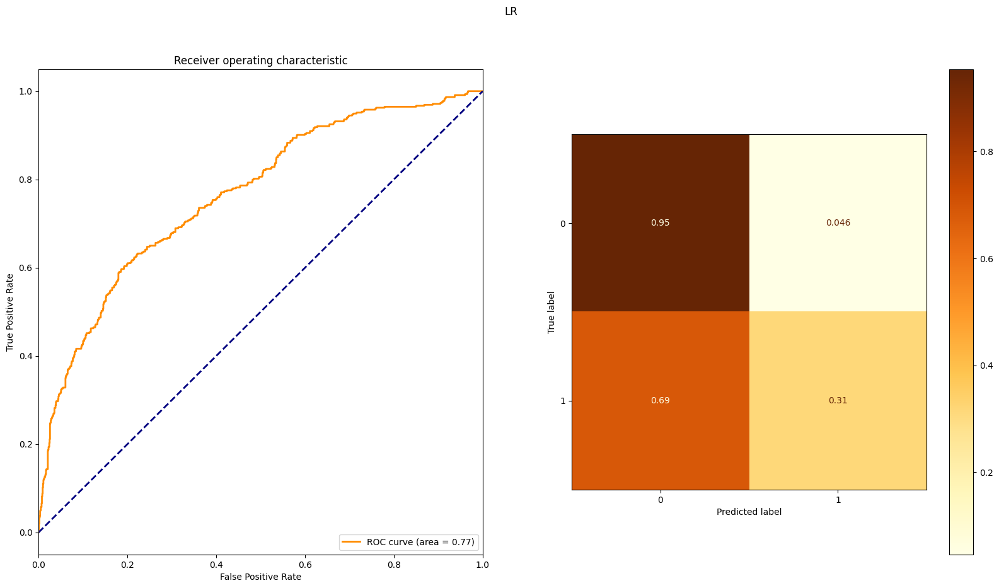

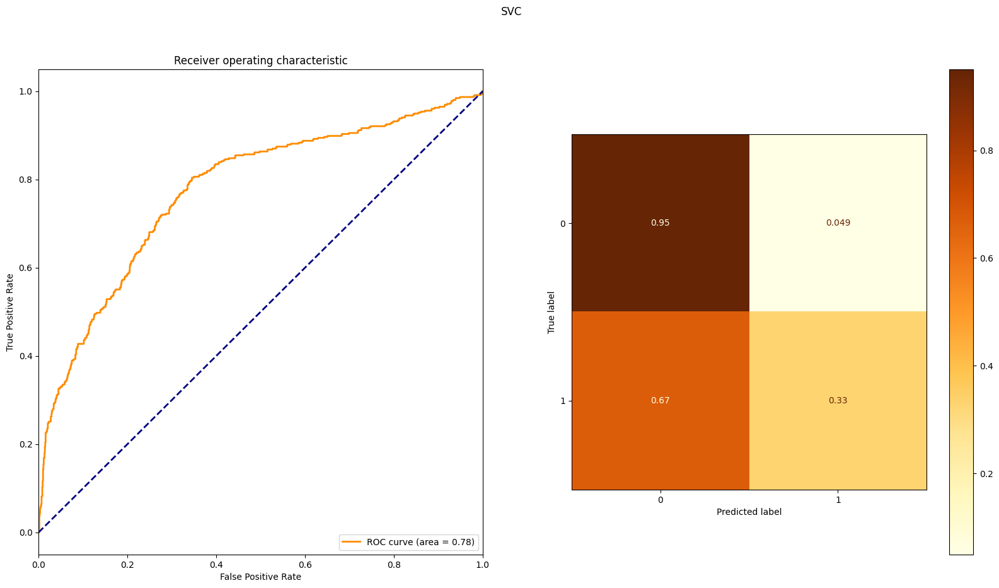

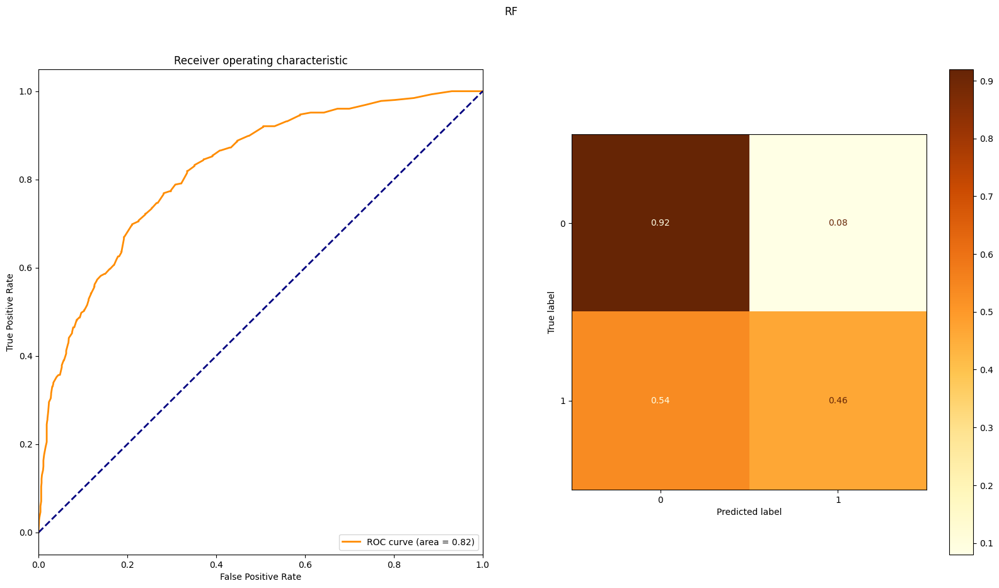

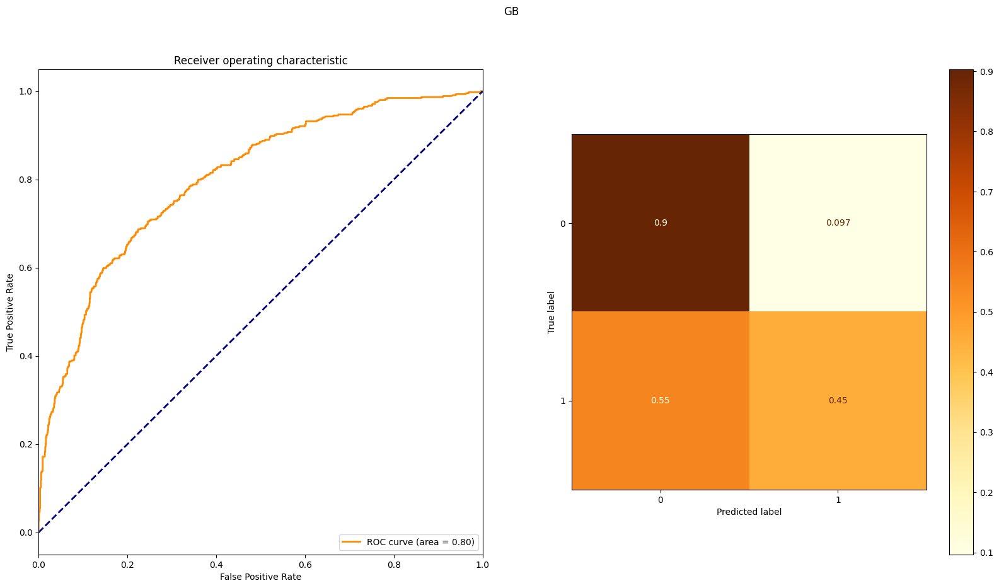

In [69]:
model_list.set_metrics(balanced_accuracy=balanced_accuracy_score, f1=f1_score, roc_auc=roc_auc_score)
for key in model_list.keys:
    model_list.get_model_metrics(key)

### Подбор гиперпараметров для выбранных моделей с использованием RandomizedSearchCV.

Создаем новую модель метода ближайших соседей, подбираем лучшие параметры.

In [70]:
model_list['KNN_OPT'] = KNeighborsClassifier

n_range = list(range(1, 50))
weights_range = ['uniform', 'distance']
p_range = [1, 2]
param_grid = dict(n_neighbors=n_range, weights=weights_range, p=p_range)

rs = RandomizedSearchCV(model_list.classes['KNN_OPT'](), param_grid, scoring='balanced_accuracy')
random_search=rs.fit(X_train.to_numpy(), y_train.to_numpy().flatten())

best_n = random_search.best_params_['n_neighbors']
best_weights = random_search.best_params_['weights']
best_p = random_search.best_params_['p']
best_n, best_weights, best_p

(12, 'distance', 2)

Устанавливаем модели найденные лучшие параметры, вычисляем значения метрик, выводим графики для сравнения с baseline-моделью.

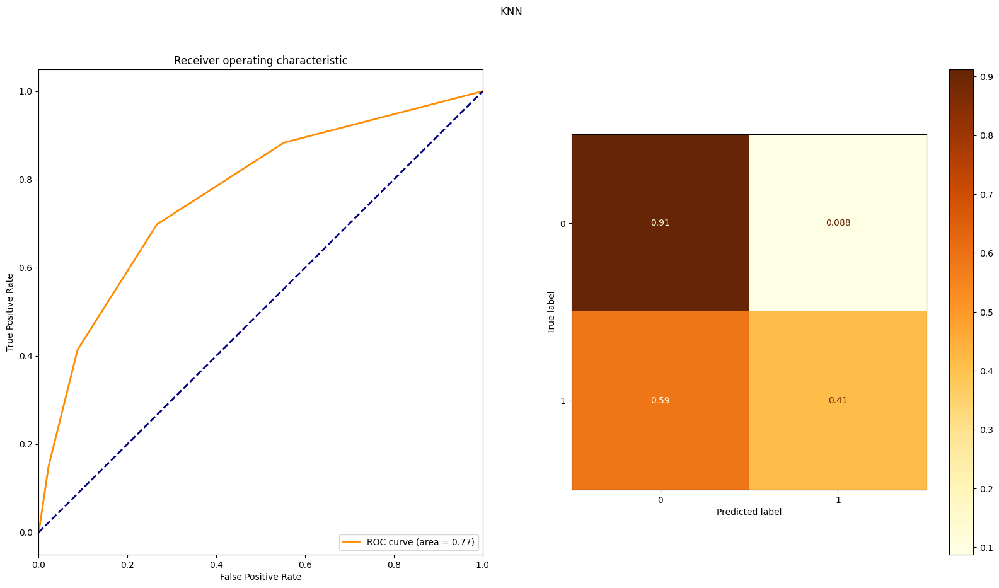

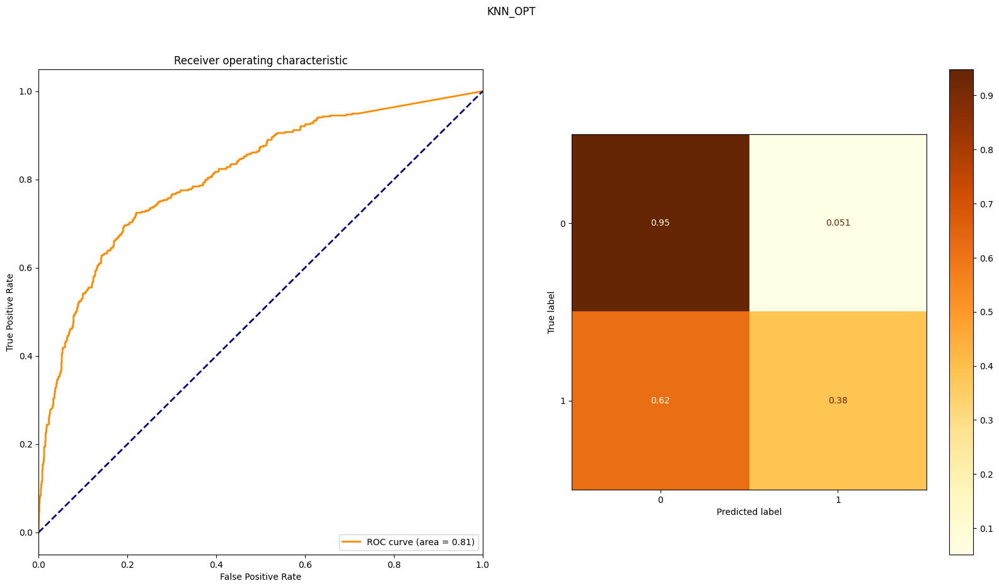

In [71]:
model_list.set_params('KNN_OPT', n_neighbors=best_n, weights=best_weights, p=best_p)
model_list.initialize(model_key='KNN_OPT')
model_list.fit(model_key='KNN_OPT')
model_list.predict(model_key='KNN_OPT')

model_list.get_model_metrics('KNN')
model_list.get_model_metrics('KNN_OPT')

Создаем новую модель логистической регрессии, подбираем лучшие параметры.

In [72]:
import warnings
warnings.filterwarnings('ignore')

model_list['LR_OPT'] = LogisticRegression

C_range = [float(10**(power / 100)) for power in range(-200, 201)]
solver_range = ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
class_weight_range = [{0: i, 1: 1000 - i} for i in range(1, 1000)]
param_grid = dict(C=C_range, solver=solver_range, class_weight=class_weight_range)

rs = RandomizedSearchCV(model_list.classes['LR_OPT'](), param_grid, scoring='balanced_accuracy')
random_search=rs.fit(X_train.to_numpy(), y_train.to_numpy().flatten())

best_C = random_search.best_params_['C']
best_solver = random_search.best_params_['solver']
best_class_weight = random_search.best_params_['class_weight']
best_C, best_solver, best_class_weight

(57.543993733715695, 'newton-cholesky', {0: 281, 1: 719})

Устанавливаем модели найденные лучшие параметры, вычисляем значения метрик, выводим графики для сравнения с baseline-моделью.

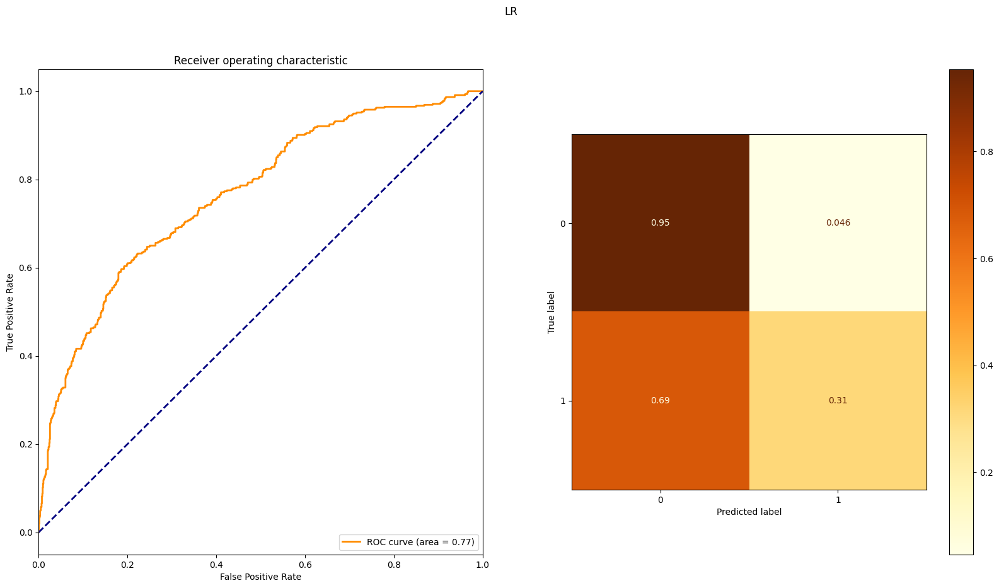

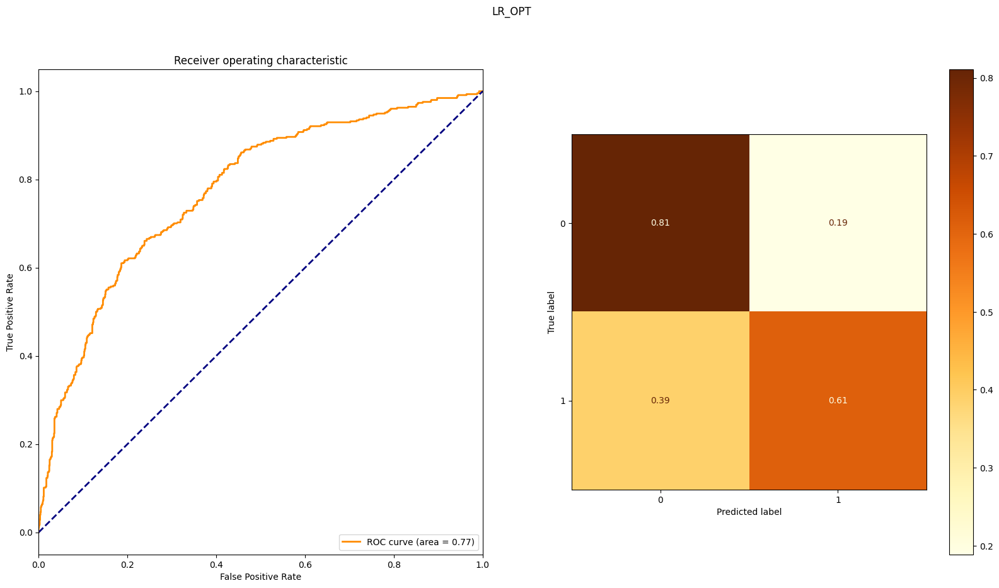

In [73]:
model_list.set_params('LR_OPT', C=best_C, solver=best_solver, class_weight=best_class_weight)
model_list.initialize(model_key='LR_OPT')
model_list.fit(model_key='LR_OPT')
model_list.predict(model_key='LR_OPT')

model_list.get_model_metrics('LR')
model_list.get_model_metrics('LR_OPT')

Создаем новую модель метода опорных векторов, подбираем лучшие параметры.

In [74]:
model_list['SVC_OPT'] = SVC

C_range = [float(10**(power / 100)) for power in range(-200, 201)]
kernel_range = ['linear', 'poly', 'rbf', 'sigmoid']
class_weight_range = [{0: i, 1: 1000 - i} for i in range(1, 1000)]
param_grid = dict(C=C_range, kernel=kernel_range, class_weight=class_weight_range)

rs = RandomizedSearchCV(model_list.classes['SVC_OPT'](), param_grid, scoring='balanced_accuracy')
random_search=rs.fit(X_train.to_numpy(), y_train.to_numpy().flatten())

best_C = random_search.best_params_['C']
best_kernel = random_search.best_params_['kernel']
best_class_weight = random_search.best_params_['class_weight']
best_C, best_kernel, best_class_weight

(0.5011872336272722, 'linear', {0: 442, 1: 558})

Устанавливаем модели найденные лучшие параметры, вычисляем значения метрик, выводим графики для сравнения с baseline-моделью.

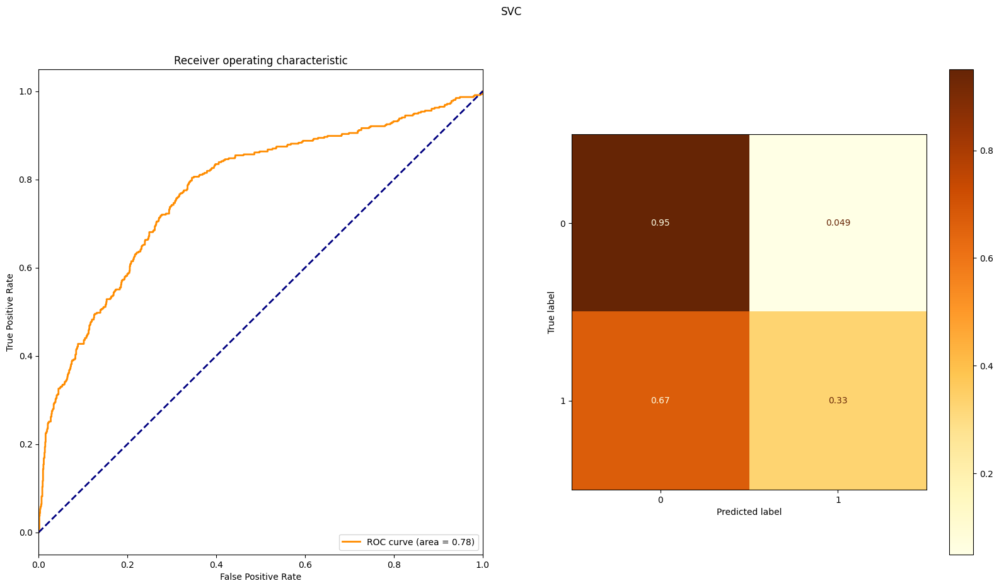

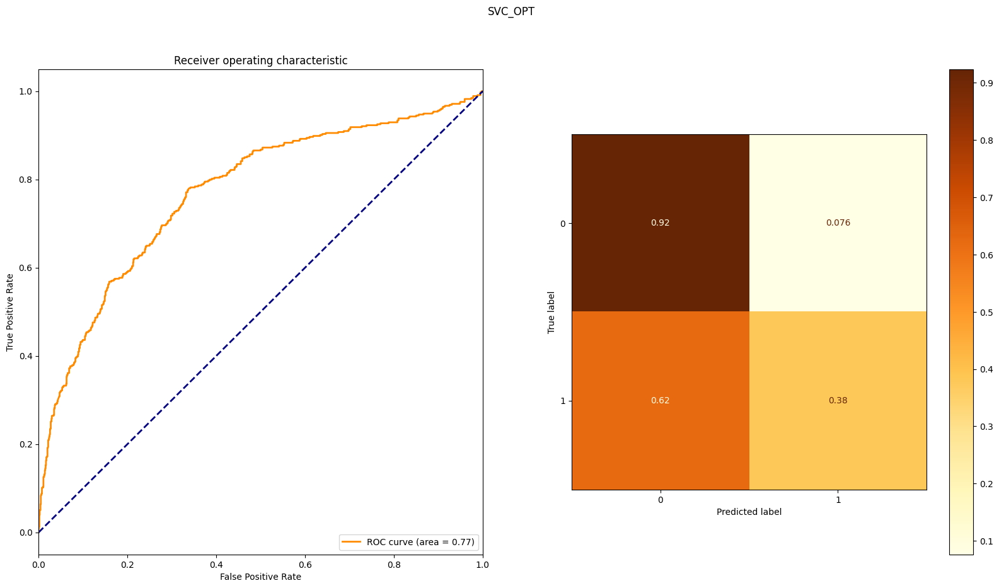

In [75]:
model_list.set_params('SVC_OPT', C=best_C, kernel=best_kernel, class_weight=best_class_weight, probability=True)
model_list.initialize(model_key='SVC_OPT')
model_list.fit(model_key='SVC_OPT')
model_list.predict(model_key='SVC_OPT')

model_list.get_model_metrics('SVC')
model_list.get_model_metrics('SVC_OPT')

Создаем новую модель случайного леса, подбираем лучшие параметры.

In [76]:
model_list['RF_OPT'] = RandomForestClassifier

n_range = [int(10**(i / 10)) for i in range(0, 31)]
features_range = [None, 'sqrt', 'log2']
criterion_range = ['gini', 'entropy', 'log_loss']
class_weight_range = [{0: i, 1: 1000 - i} for i in range(1, 1000)]
param_grid = dict(n_estimators=n_range, max_features=features_range, criterion=criterion_range, class_weight=class_weight_range)

rs = RandomizedSearchCV(model_list.classes['RF_OPT'](), param_grid, scoring='balanced_accuracy')
random_search=rs.fit(X_train.to_numpy(), y_train.to_numpy().flatten())

best_n = random_search.best_params_['n_estimators']
best_features = random_search.best_params_['max_features']
best_criterion = random_search.best_params_['criterion']
best_class_weight = random_search.best_params_['class_weight']
best_n, best_features, best_criterion, best_class_weight

(79, 'log2', 'gini', {0: 451, 1: 549})

Устанавливаем модели найденные лучшие параметры, вычисляем значения метрик, выводим графики для сравнения с baseline-моделью.

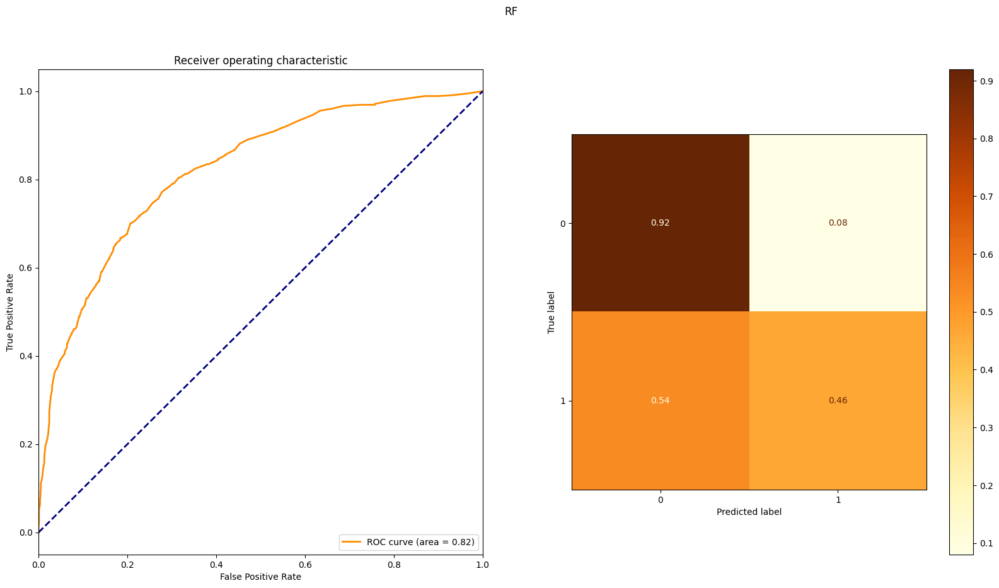

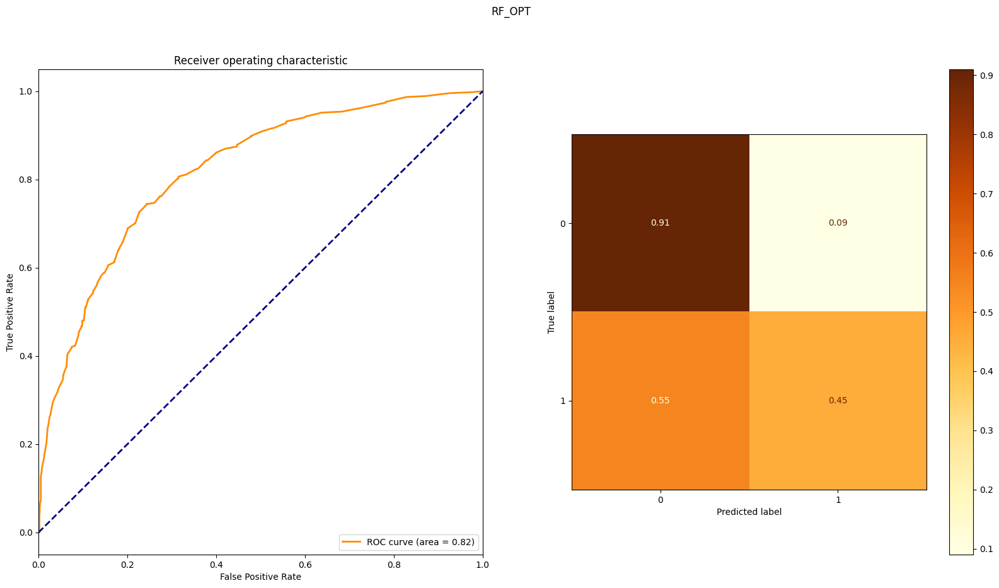

In [77]:
model_list.set_params('RF_OPT', n_estimators=best_n, max_features=best_features, criterion=best_criterion, class_weight=best_class_weight)
model_list.initialize(model_key='RF_OPT')
model_list.fit(model_key='RF_OPT')
model_list.predict(model_key='RF_OPT')

model_list.get_model_metrics('RF')
model_list.get_model_metrics('RF_OPT')

Создаем новую модель градиентного бустинга, подбираем лучшие параметры.

In [78]:
model_list['GB_OPT'] = GradientBoostingClassifier

loss_range = ['log_loss', 'exponential']
rate_range = [float(10**(power / 100)) for power in range(-200, 201)]
n_range = [int(10**(i / 10)) for i in range(0, 31)]
criterion_range = ['friedman_mse', 'squared_error']
param_grid = dict(loss=loss_range, learning_rate=rate_range, n_estimators=n_range, criterion=criterion_range)

rs = RandomizedSearchCV(model_list.classes['GB_OPT'](), param_grid, scoring='balanced_accuracy')
random_search=rs.fit(X_train.to_numpy(), y_train.to_numpy().flatten())

best_loss = random_search.best_params_['loss']
best_rate = random_search.best_params_['learning_rate']
best_n = random_search.best_params_['n_estimators']
best_criterion = random_search.best_params_['criterion']
best_loss, best_rate, best_n, best_criterion

('log_loss', 0.07943282347242814, 501, 'squared_error')

Устанавливаем модели найденные лучшие параметры, вычисляем значения метрик, выводим графики для сравнения с baseline-моделью.

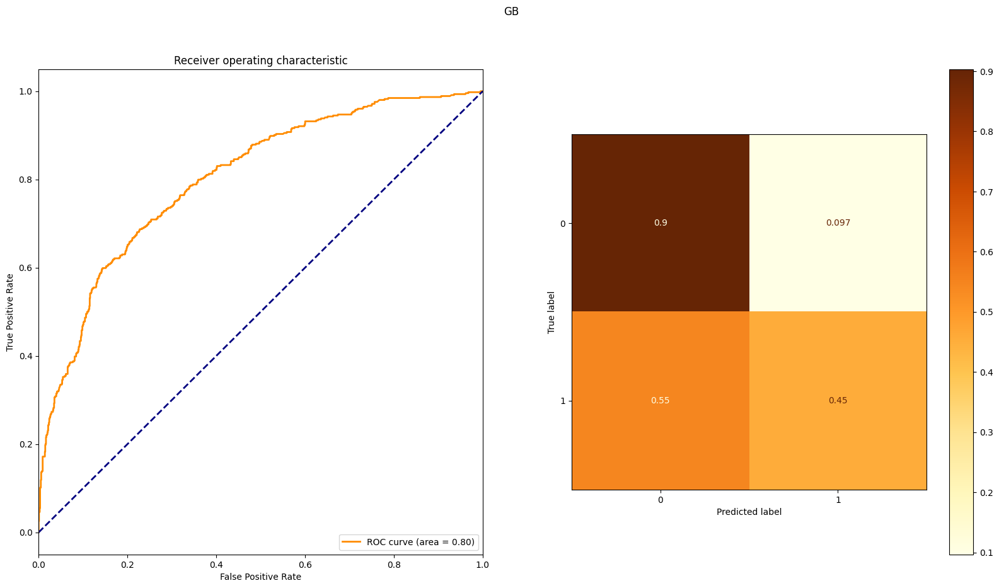

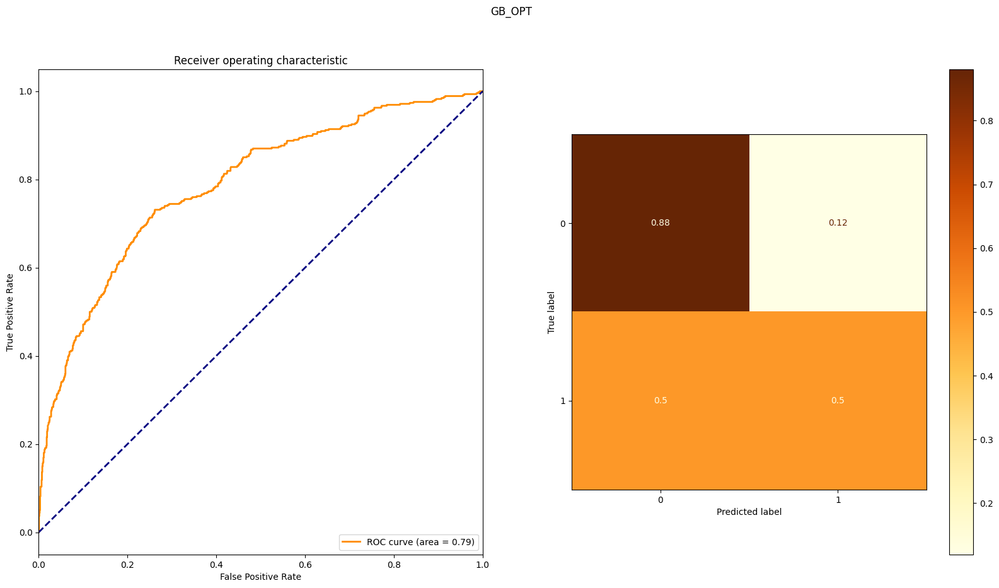

In [79]:
model_list.set_params('GB_OPT', loss=best_loss, learning_rate=best_rate, n_estimators=best_n, criterion=best_criterion)
model_list.initialize(model_key='GB_OPT')
model_list.fit(model_key='GB_OPT')
model_list.predict(model_key='GB_OPT')

model_list.get_model_metrics('GB')
model_list.get_model_metrics('GB_OPT')

### Формирование выводов о качестве построенных моделей на основе выбранных метрик.

Выведем значения каждой метрики для всех моделей.

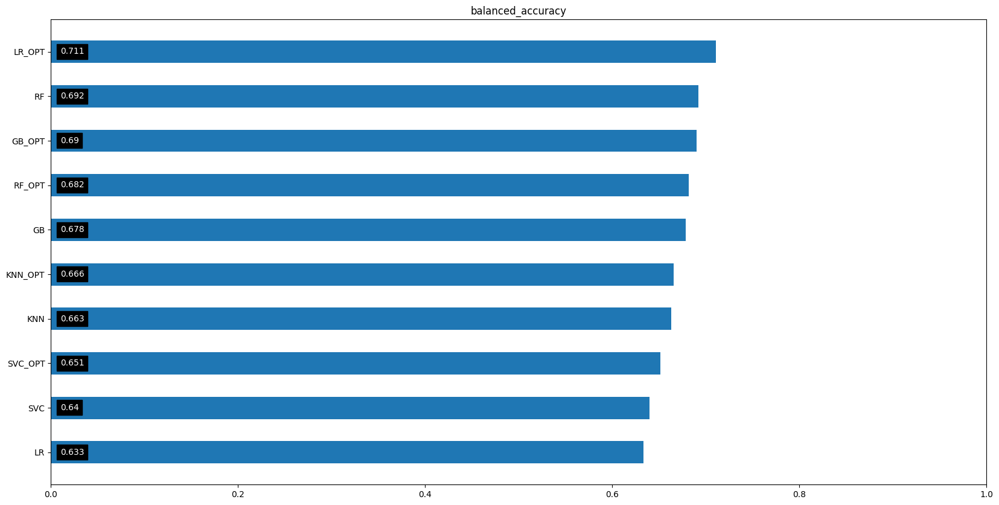

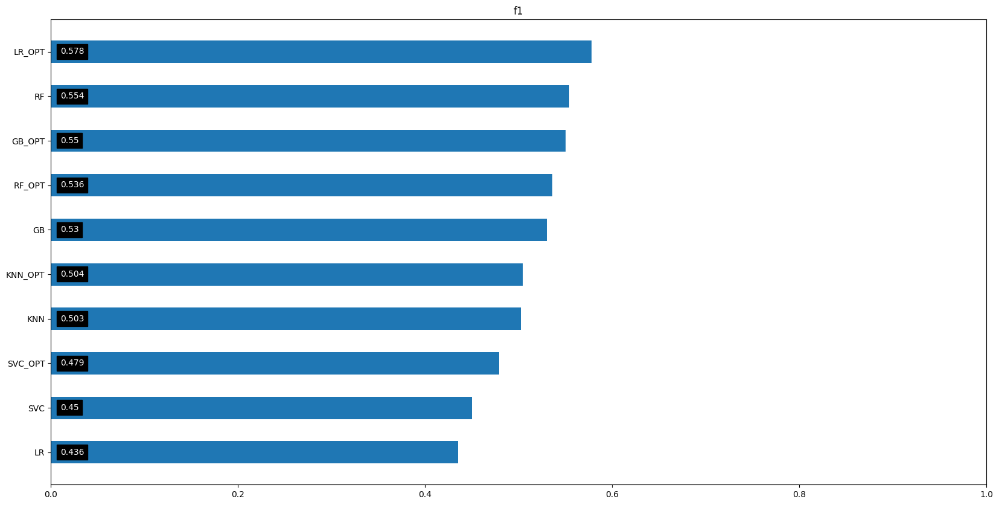

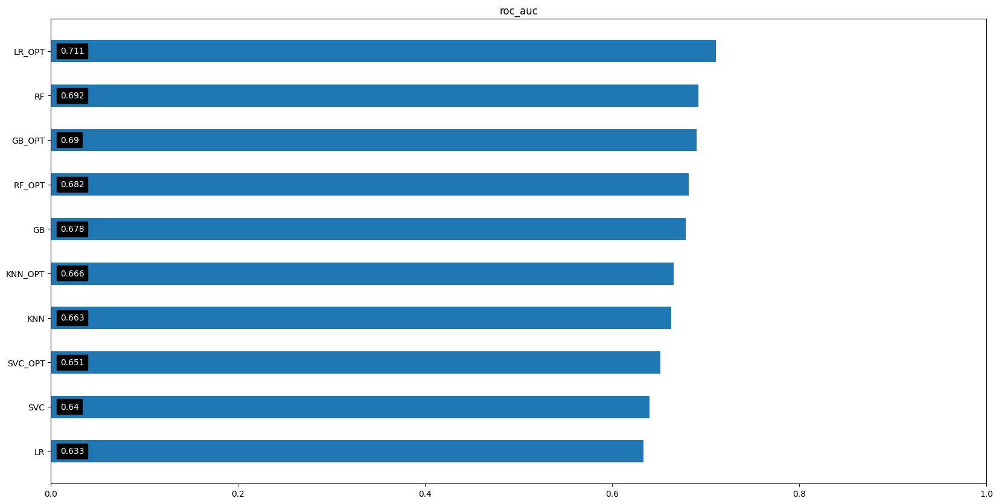

In [80]:
for metric_label in model_list.metrics:
    model_list.plot_metrics(metric_label)

**Выводы:**
- Оптимизация **метода ближайших соседей** привела к несколько *лучшим* результатам по всем метрикам
- Оптимизация **логистической регрессии** привела к намного *лучшим* результатам по всем метрикам
- Оптимизация **метода опорных векторов** привела к несколько *лучшим* результатам по всем метрикам
- Оптимизация **случайного леса привела** к несколько *худшим* результатам по всем метрикам
- Оптимизация **градиентного бустинга** привела к несколько *лучшим* результатам по всем метрикам
- Лучшие результаты были показаны методом **логистической регрессии** после оптимизации